In [3]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [4]:
#Change the working directory where data is copied
os.chdir('C:\Brijesh\Projects\Datascience\EDA\EDA')
df_features=pd.read_csv('Features data set.csv')
df_sales=pd.read_csv('sales data-set.csv')
df_stores=pd.read_csv('stores data-set.csv')

In [5]:
df_features.head()

,Store,Date,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday
0,1,2017-02-03,42.31,2.572,211.096358,8.106,False
1,1,2017-02-10,38.51,2.548,211.242170,8.106,True
2,1,2017-02-17,39.93,2.514,211.289143,8.106,False
3,1,2017-02-24,46.63,2.561,211.319643,8.106,False
4,1,2017-03-03,46.50,2.625,211.350143,8.106,False


In [6]:
df_sales.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2017-02-03,24924.50,False
1,1,1,2017-02-10,46039.49,True
2,1,1,2017-02-17,41595.55,False
3,1,1,2017-02-24,19403.54,False
4,1,1,2017-03-03,21827.90,False


In [7]:
df_stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [9]:
##Creating the base table, combining all the table
##Drop IsHiliday from one dataset as duplicates
df_interim=pd.merge(df_sales,df_features.drop('IsHoliday',axis=1),on=['Store','Date'],how='left')
df_basetable=pd.merge(df_interim,df_stores,on='Store',how='left')

In [10]:
df_basetable.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2017-02-03,24924.50,False,42.31,2.572,211.096358,8.106,A,151315
1,1,1,2017-02-10,46039.49,True,38.51,2.548,211.242170,8.106,A,151315
2,1,1,2017-02-17,41595.55,False,39.93,2.514,211.289143,8.106,A,151315
3,1,1,2017-02-24,19403.54,False,46.63,2.561,211.319643,8.106,A,151315
4,1,1,2017-03-03,21827.90,False,46.50,2.625,211.350143,8.106,A,151315


In [11]:
#Date Column minimum and maximum
print("\n","Minimum Date Value: ",df_basetable['Date'].min(),'\n',
      "Maximum Date Value: ",df_basetable['Date'].max())


 Minimum Date Value:  2017-02-03 
 Maximum Date Value:  2019-10-25


In [12]:
print("\n","Store unique count: ",df_basetable['Store'].nunique(),'\n',
      "Dept unique count: ",df_basetable['Dept'].nunique())


 Store unique count:  45 
 Dept unique count:  81


<Axes: xlabel='Date'>

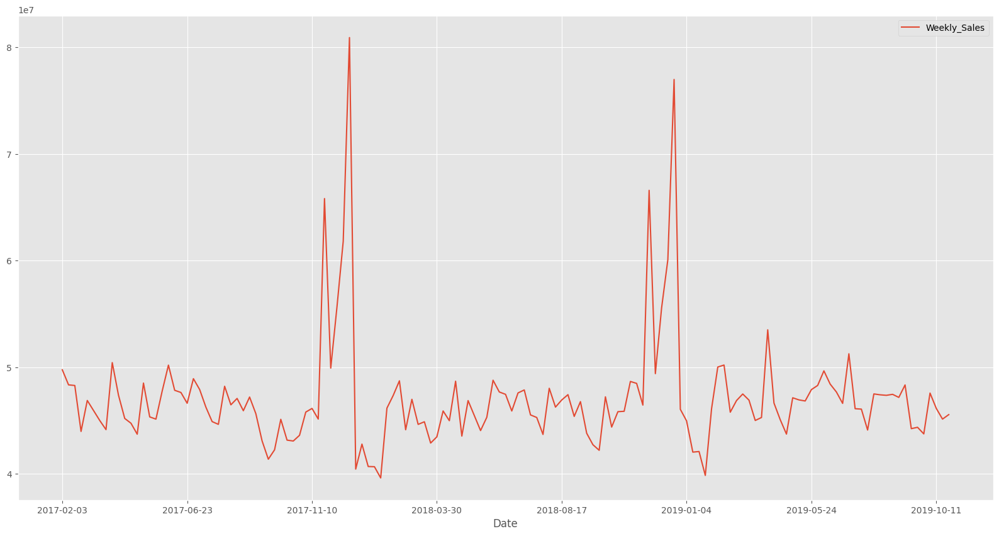

In [14]:
df_basetable.groupby(by=['Date'], as_index=False)['Weekly_Sales'].sum()\
                            .plot(x='Date',y='Weekly_Sales',figsize=(20,10))

In [11]:
df_basetable.describe()

,Store,Dept,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Size
count,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123,60.090059,3.361027,171.201947,7.960289,136727.915739
std,12.785297,30.492054,22711.183519,18.447931,0.458515,39.159276,1.863296,60980.583328
min,1.000000,1.000000,-4988.940000,-2.060000,2.472000,126.064000,3.879000,34875.000000
25%,11.000000,18.000000,2079.650000,46.680000,2.933000,132.022667,6.891000,93638.000000
50%,22.000000,37.000000,7612.030000,62.090000,3.452000,182.318780,7.866000,140167.000000
75%,33.000000,74.000000,20205.852500,74.280000,3.738000,212.416993,8.572000,202505.000000
max,45.000000,99.000000,693099.360000,100.140000,4.468000,227.232807,14.313000,219622.000000


In [15]:
df_basetable.isnull().any()

Store           False
Dept            False
Date            False
Weekly_Sales    False
IsHoliday       False
Temperature     False
Fuel_Price      False
CPI             False
Unemployment    False
Type            False
Size            False
dtype: bool

In [16]:
#Format the data Store, Department as string, since they are ID and not numeric value
df_basetable['Store']=df_basetable['Store'].astype('str')
df_basetable['Dept']=df_basetable['Dept'].astype('str')

In [17]:
#Number of Unique Store and Department
df_basetable['Store'].nunique(),df_basetable['Dept'].nunique()

(45, 81)

In [18]:
#Average number of Dept across each store type
df_basetable[['Store','Type','Dept']].drop_duplicates().groupby(['Store','Type']).count().\
                                        reset_index()[['Type','Dept']].groupby('Type').mean()

,Dept
Type,
A,75.954545
B,75.647059
C,62.333333


In [19]:
#Average number of Dept across each store type
df_basetable[['Type','Size']].drop_duplicates().groupby(['Type']).mean()

,Size
Type,
A,175982.428571
B,101190.705882
C,40912.500000


In [20]:
df_basetable.dtypes

Store            object
Dept             object
Date             object
Weekly_Sales    float64
IsHoliday          bool
Temperature     float64
Fuel_Price      float64
CPI             float64
Unemployment    float64
Type             object
Size              int64
dtype: object

array([[<Axes: title={'center': 'Weekly_Sales'}>,
        <Axes: title={'center': 'Temperature'}>],
       [<Axes: title={'center': 'Fuel_Price'}>,
        <Axes: title={'center': 'CPI'}>],
       [<Axes: title={'center': 'Unemployment'}>,
        <Axes: title={'center': 'Size'}>]], dtype=object)

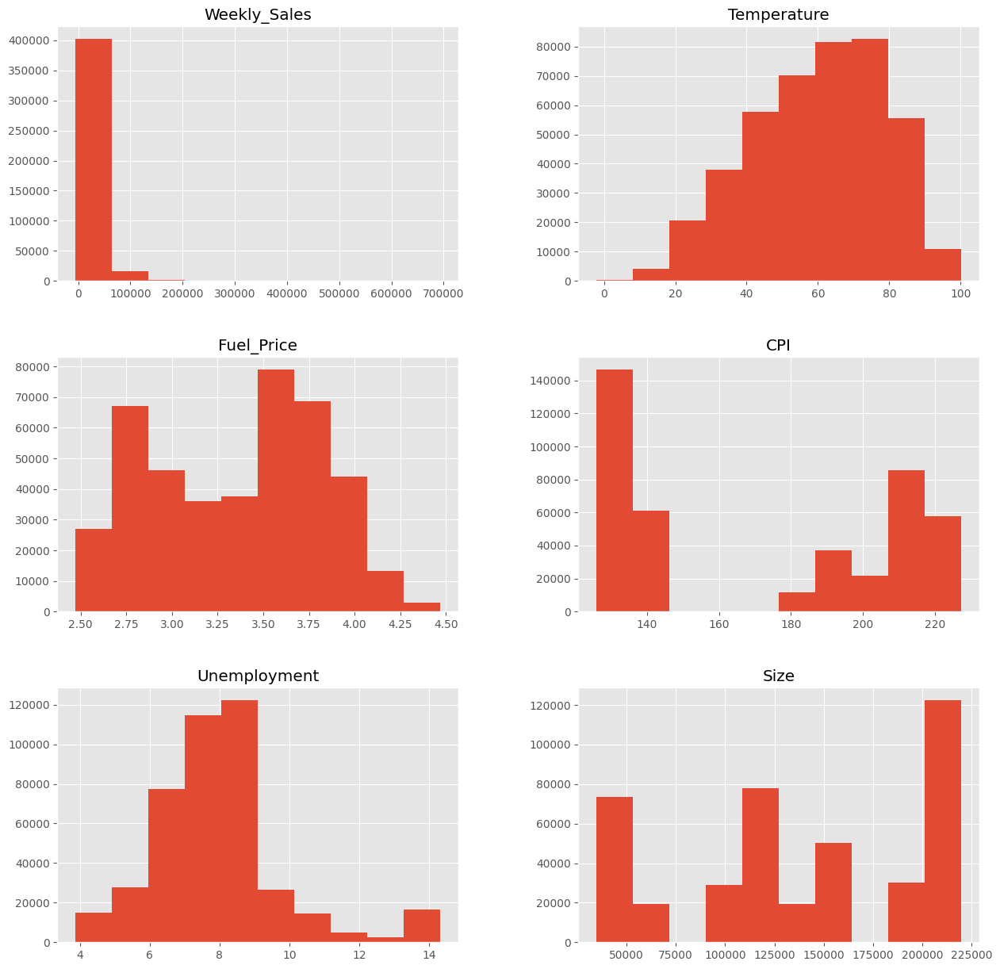

In [21]:
#Dropping the boolean column, as it treated numeric internally
df_basetable._get_numeric_data().drop('IsHoliday',axis=1).hist(figsize=(15,15))

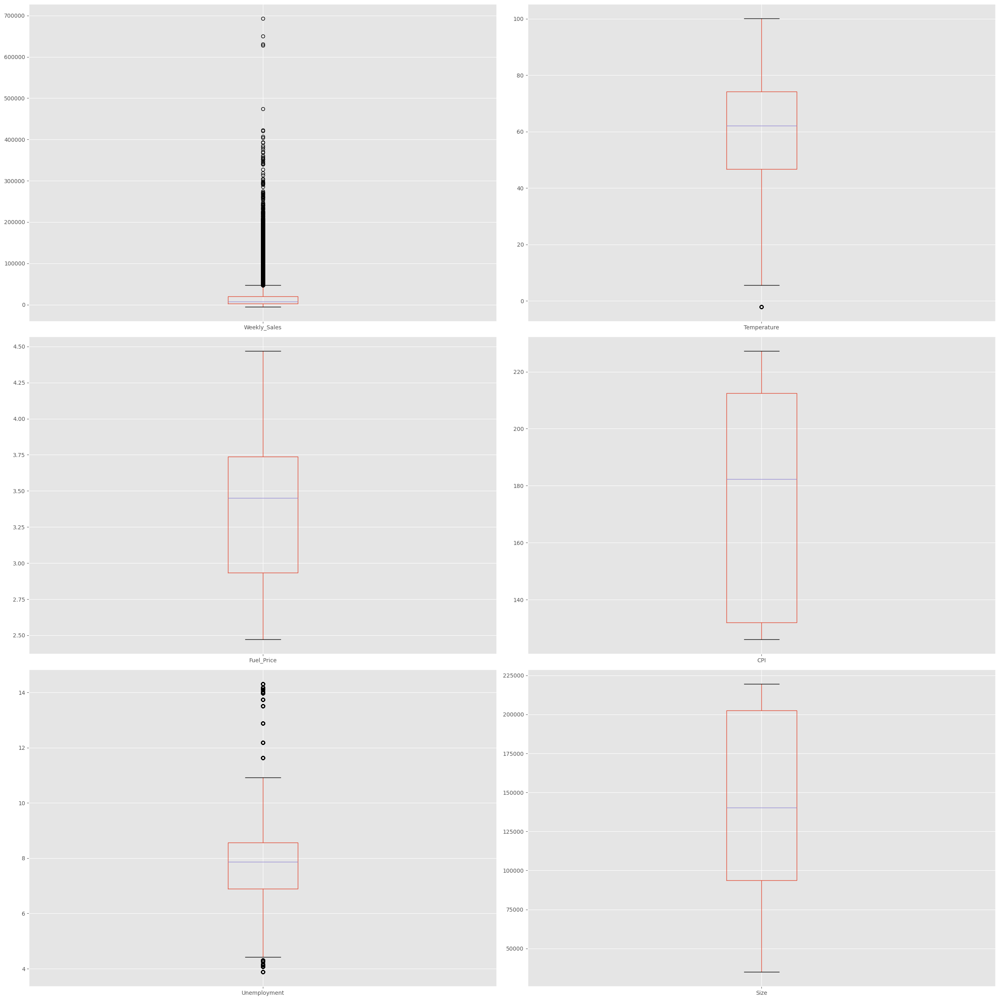

In [25]:
#Boxplot
clmn=df_basetable._get_numeric_data().drop('IsHoliday',axis=1).columns
fig, axes = plt.subplots(3,2,figsize=(25,25)) # create figure and axes
for i,el in enumerate(list(clmn)):
    a = df_basetable.boxplot(el, ax=axes.flatten()[i])

#fig.delaxes(axes[1,1]) # remove empty subplot
plt.tight_layout() 
plt.show()

In [26]:
#Single boxplot
px.box(df_basetable, y="Temperature").show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [27]:
Var_corr=df_basetable.drop('IsHoliday',axis=1).corr()

ValueError: could not convert string to float: '2017-02-03'

NameError: name 'Var_corr' is not defined

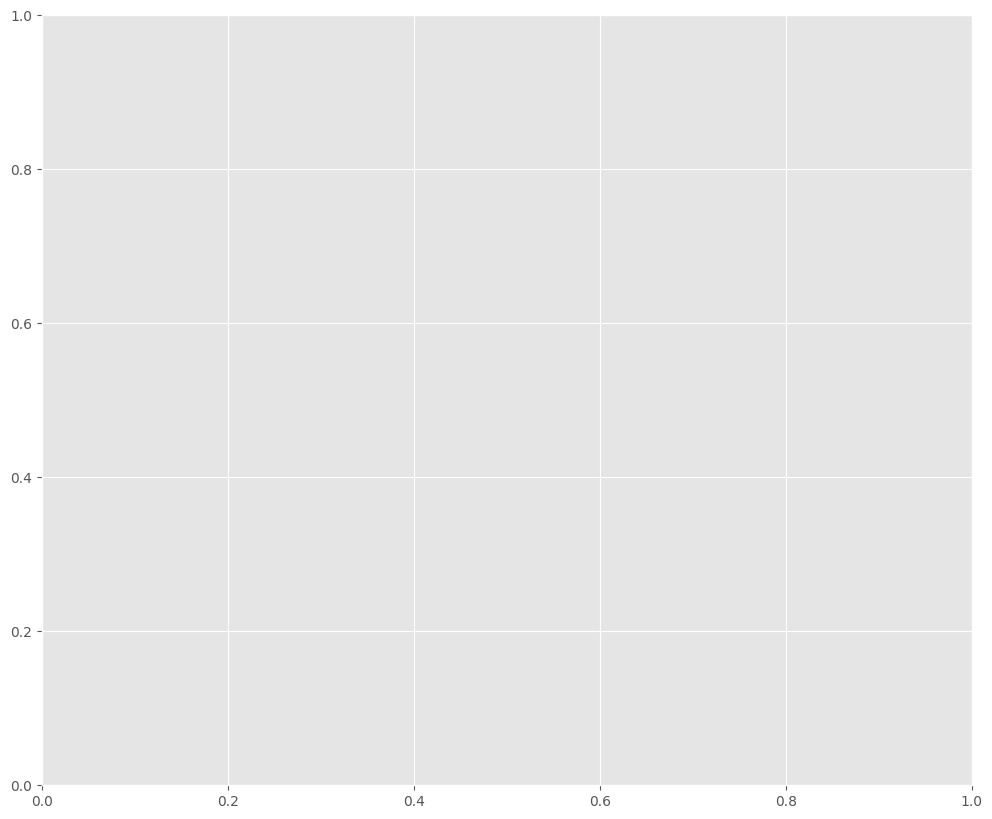

In [28]:
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(np.round(Var_corr,3), xticklabels=Var_corr.columns, yticklabels=Var_corr.columns, annot=True,ax=ax,cmap="YlGnBu")

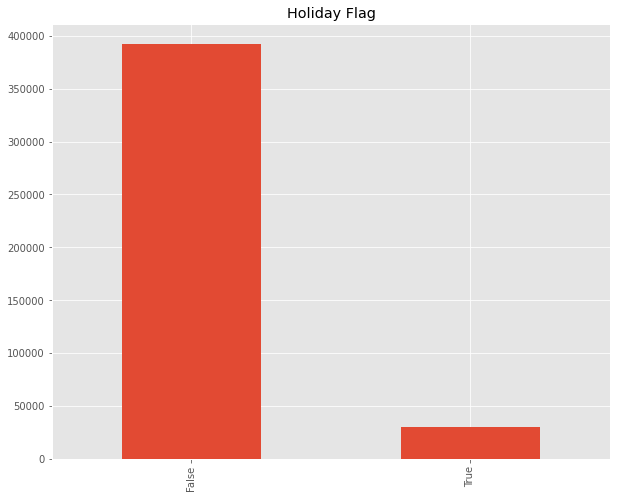

In [23]:
df_basetable['IsHoliday'].value_counts().plot(kind='bar',figsize=(10,8),title='Holiday Flag')

<Axes: title={'center': 'Store Type Count'}, xlabel='Type'>

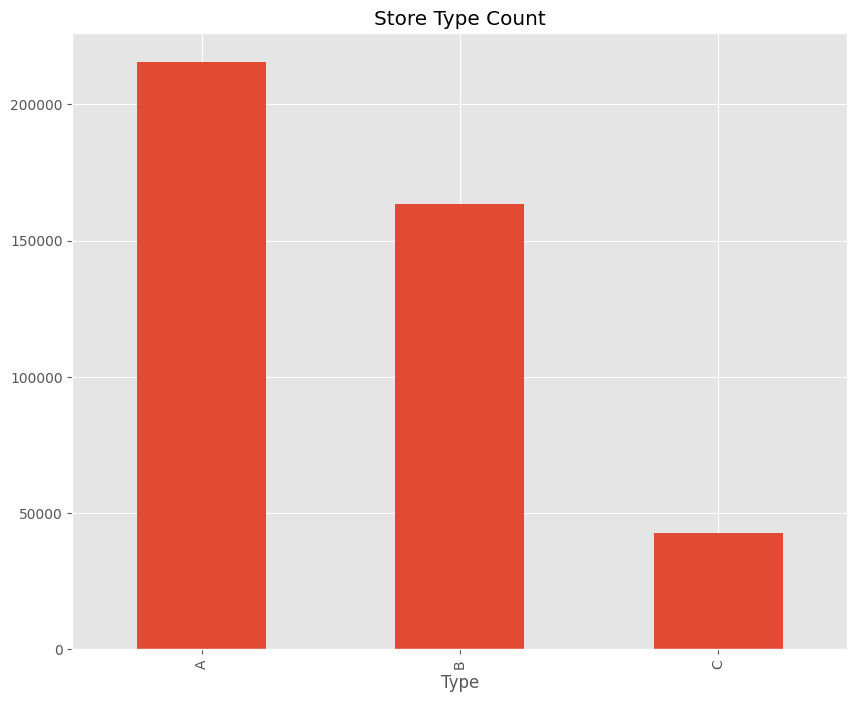

In [29]:
df_basetable['Type'].value_counts().plot(kind='bar',figsize=(10,8),title='Store Type Count')

In [30]:
fig_type_pie = px.pie(df_basetable, names='Type', title='Store Type Count across Stores')
fig_type_pie.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [31]:
fig_scatter = px.scatter(df_basetable,x='Size', y='Weekly_Sales')
fig_scatter.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [27]:
#Single boxplot by Categorical Varaible
px.box(df_basetable, y="Size",x="Type").show()

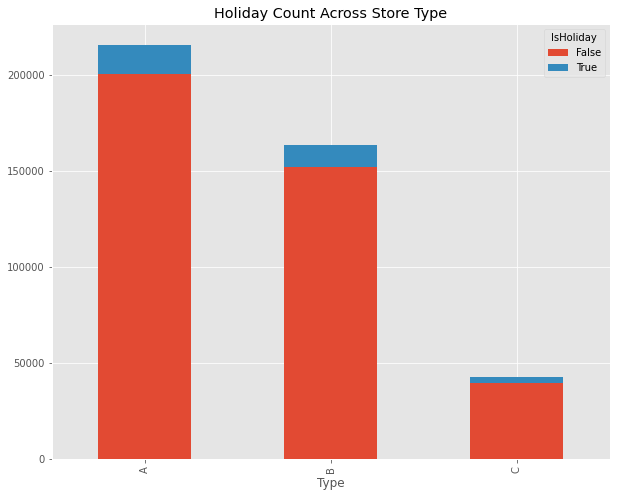

In [28]:
#Stacked bar graph
df_basetable.groupby(['Type', 'IsHoliday']).size().unstack().plot(kind='bar',stacked=True,figsize=(10,8),
                                                                  title='Holiday Count Across Store Type')

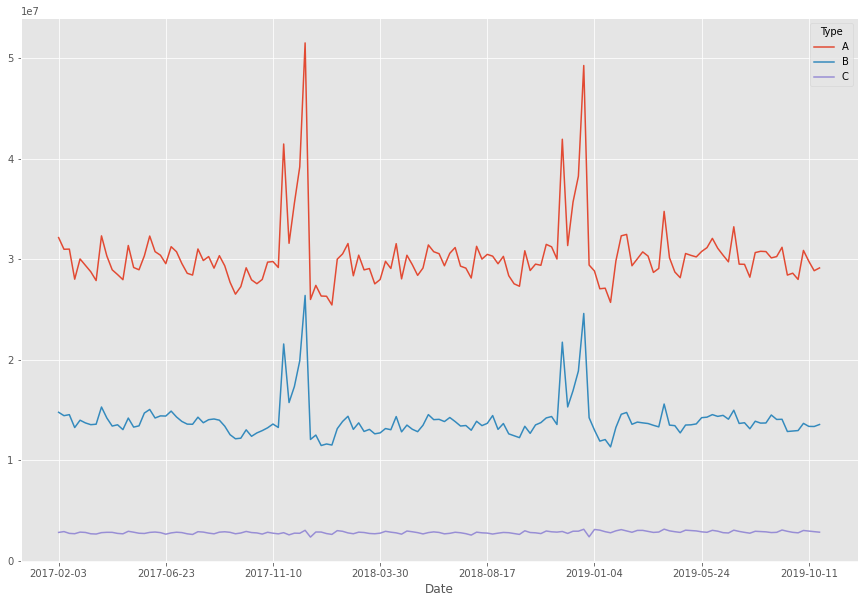

In [29]:
#Stacked Line Chart
df_basetable.groupby(by=['Date','Type'], as_index=False)['Weekly_Sales'].sum()\
                    .pivot(index='Date', columns='Type', values='Weekly_Sales').plot(figsize=(15,10))

# FEATURE ENGINEERING

In [30]:
df_basetable

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size
0,1,1,2017-02-03,24924.50,False,42.31,2.572,211.096358,8.106,A,151315
1,1,1,2017-02-10,46039.49,True,38.51,2.548,211.242170,8.106,A,151315
2,1,1,2017-02-17,41595.55,False,39.93,2.514,211.289143,8.106,A,151315
3,1,1,2017-02-24,19403.54,False,46.63,2.561,211.319643,8.106,A,151315
4,1,1,2017-03-03,21827.90,False,46.50,2.625,211.350143,8.106,A,151315
...,...,...,...,...,...,...,...,...,...,...,...
421565,45,98,2019-09-27,508.37,False,64.88,3.997,192.013558,8.684,B,118221
421566,45,98,2019-10-04,628.10,False,64.89,3.985,192.170412,8.667,B,118221
421567,45,98,2019-10-11,1061.02,False,54.47,4.000,192.327265,8.667,B,118221
421568,45,98,2019-10-18,760.01,False,56.47,3.969,192.330854,8.667,B,118221


In [31]:
#Department on Store level - dummy variable
dept_dummies=pd.get_dummies(df_basetable['Dept'],prefix='Dept')
df_dept_int=pd.concat([df_basetable[['Store','Date']],dept_dummies], axis=1)
df_dept_dum=df_dept_int.groupby(['Store','Date']).max().reset_index()

#Store Type - dummy variable
str_typ_dummies=pd.get_dummies(df_basetable['Type'],prefix='Type')
df_str_typ_int=pd.concat([df_basetable[['Store','Date']],str_typ_dummies], axis=1)
df_str_typ_dum=df_str_typ_int.groupby(['Store','Date']).max().reset_index()

In [32]:
#Aggregated data on Store level
df_agg=df_basetable.groupby(['Store','Date']).agg({'Weekly_Sales':'sum','Temperature':'max','Fuel_Price':'max',\
                                                  'CPI':'max','Unemployment':'max','Size':'max'}).reset_index()
#Holiday
df_holi=df_basetable[['Store','Date','IsHoliday']].drop_duplicates().reset_index(drop=True)

In [33]:
#Extracting Date Features
df_basetable['Date_new']=pd.to_datetime(df_basetable['Date'],format='%Y-%m-%d')
#Week Number
df_basetable['Week_Number']=df_basetable['Date_new'].dt.week
#Quarter Number
df_basetable['Quarter_Number']=df_basetable['Date_new'].dt.quarter
#Aggregating
df_time_feat=df_basetable[['Store','Date','Date_new','Week_Number','Quarter_Number']].\
                                        groupby(['Store','Date','Date_new']).max().reset_index()

In [34]:
#Minimum and Maiximum Dates
df_basetable['Date_new'].min(),df_basetable['Date_new'].max()

(Timestamp('2017-02-03 00:00:00'), Timestamp('2019-10-25 00:00:00'))

<b><u>NOTE</u>: As we don't want to include too much historical records as customers behaviour changes over time. Due to that we will consider only one year of most recent record to create the model i.e. data from 1-Sep-2018 to 31-Oct-2019.

In [35]:
#Filtering the relevenat data
df_agg_basetable=df_time_feat[(df_time_feat['Date_new']>='2018-09-01') & (df_time_feat['Date_new']<='2019-10-31')]

In [36]:
#Combining all the features
#Department
df_agg_basetable=pd.merge(df_agg_basetable,df_dept_dum,on=['Store','Date'])
#Store Type
df_agg_basetable=pd.merge(df_agg_basetable,df_str_typ_dum,on=['Store','Date'])
#Numeric Values
df_agg_basetable=pd.merge(df_agg_basetable,df_agg,on=['Store','Date'])
#Holiday
df_agg_basetable=pd.merge(df_agg_basetable,df_holi,on=['Store','Date'])

In [37]:
#EXPLORING VARIATION IN NUMERICAL DATA
df_agg.iloc[:,2:].var()

Weekly_Sales    3.185097e+11
Temperature     3.402155e+02
Fuel_Price      2.106991e-01
CPI             1.548951e+03
Unemployment    3.518944e+00
Size            3.983759e+09
dtype: float64

<b>Our data is now ready with all the features and now we can start creating models on that.

<u>IMP</u> : The Fuel price has very low varience and further exploration can be done to check the utilty of it. 

# ML MODELLING

In [38]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence

In [39]:
#Dividing Store IDs into training and test
X_train_Store_ID, X_test_Store_ID= train_test_split(df_agg_basetable['Store'].unique(),test_size=0.30, random_state=42)

In [40]:
#Training Record
df_train=df_agg_basetable[df_agg_basetable['Store'].isin(X_train_Store_ID)]
#Test Record
df_test=df_agg_basetable[df_agg_basetable['Store'].isin(X_test_Store_ID)]

In [41]:
#Drop the id,dates and weekly sales column 
X_train=df_train.drop(['Store','Date','Date_new','Weekly_Sales'],axis=1)
X_test=df_test.drop(['Store','Date','Date_new','Weekly_Sales'],axis=1)
#Creating dependent variable
Y_train=df_train[['Weekly_Sales']]
Y_test=df_test[['Weekly_Sales']]

In [42]:
#Linear Regression Model
lnr_reg_model=LinearRegression(normalize=True,n_jobs=-1)

In [43]:
#Fit the model on training data
lnr_reg_model.fit(X_train.values,Y_train.values)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=True)

In [44]:
#Predict the linear model on test data
lr_predict=lnr_reg_model.predict(X_test.values)

In [45]:
#RSquare - Linear Model
np.round(r2_score(Y_test['Weekly_Sales'], lr_predict),3)

-1.3209468438352899e+18

<b> Neagtive RSquare means the model is doing worse than just predicting the average values of the sales.

In [46]:
#Random Forest Model
rf_model = RandomForestRegressor(n_jobs=-1)

In [47]:
#Fit the model on training data
rf_model.fit(X_train.values,Y_train.values)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [48]:
#Predict the rf model on test data
rf_predict=rf_model.predict(X_test.values)

In [49]:
#RSquare 
np.round(r2_score(Y_test['Weekly_Sales'], rf_predict),3)

0.402

In [50]:
#Mean Error - RF Model
np.round(np.sqrt(mean_squared_error(Y_test['Weekly_Sales'], rf_predict)),3)

423793.428

<b> Random Forest Model is able to capture 41% variance in the test data sales

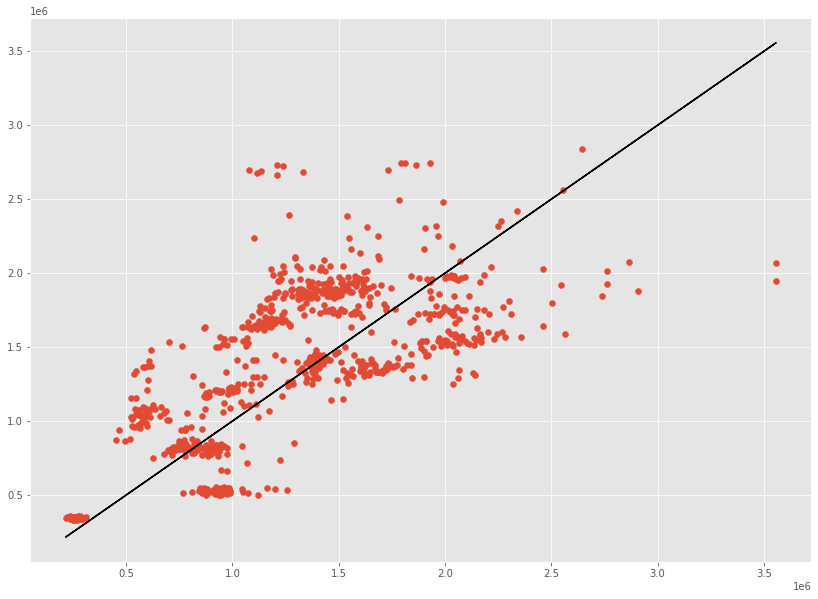

In [51]:
#Plotting Actual vs Predicted for RF model
plt.figure(figsize=(14,10))
plt.scatter(Y_test['Weekly_Sales'],rf_predict)
plt.plot(Y_test,Y_test,'k-')

<b> <u>NOTE</u>:If the model fits the data well, all the data should be close to the diagonal line.

The RF Model is doing a decent job, however the results can improve with hyperparameter tuning and further feature engineering

# Holiday Variable Contribution

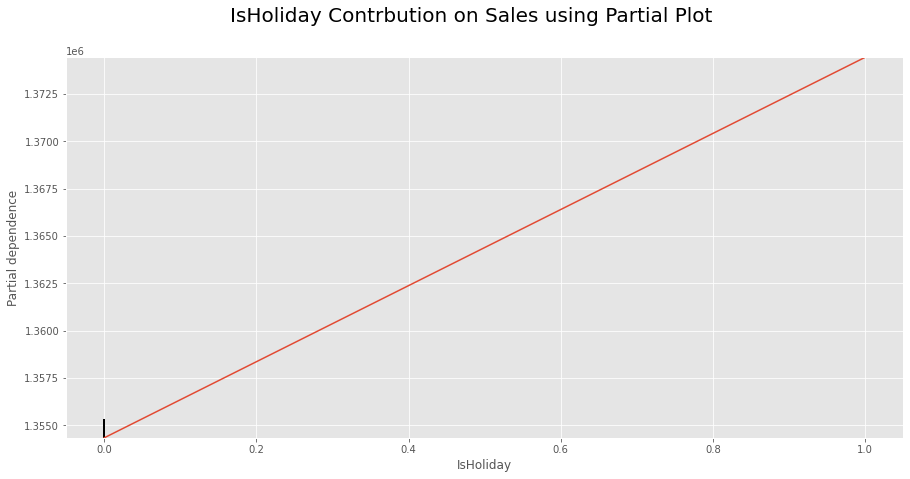

In [52]:
plot_partial_dependence(rf_model, X_test,['IsHoliday'],n_jobs=-1, grid_resolution=20)
fig = plt.gcf()
fig.suptitle('IsHoliday Contrbution on Sales using Partial Plot',fontsize = 20.0)
fig.set_figheight(7)
fig.set_figwidth(15)

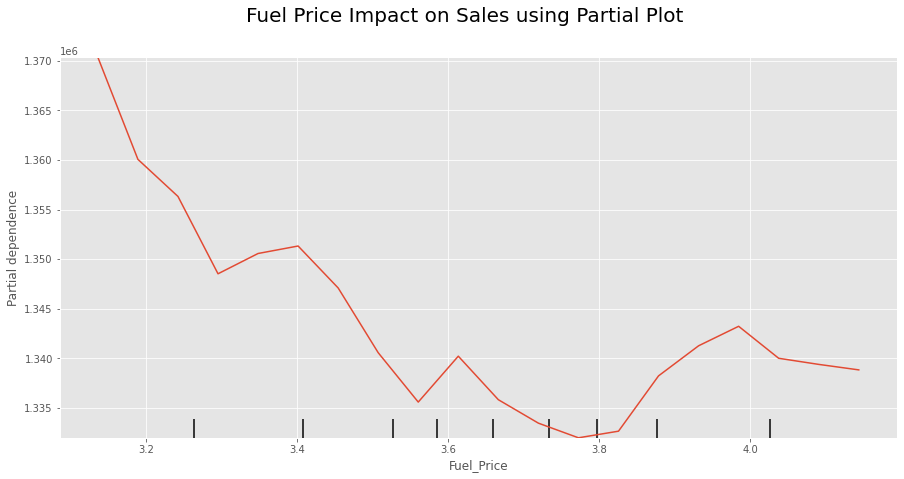

In [53]:
plot_partial_dependence(rf_model, X_test,['Fuel_Price'],n_jobs=-1, grid_resolution=20)
fig = plt.gcf()
fig.suptitle('Fuel Price Impact on Sales using Partial Plot',fontsize = 20.0)
fig.set_figheight(7)
fig.set_figwidth(15)

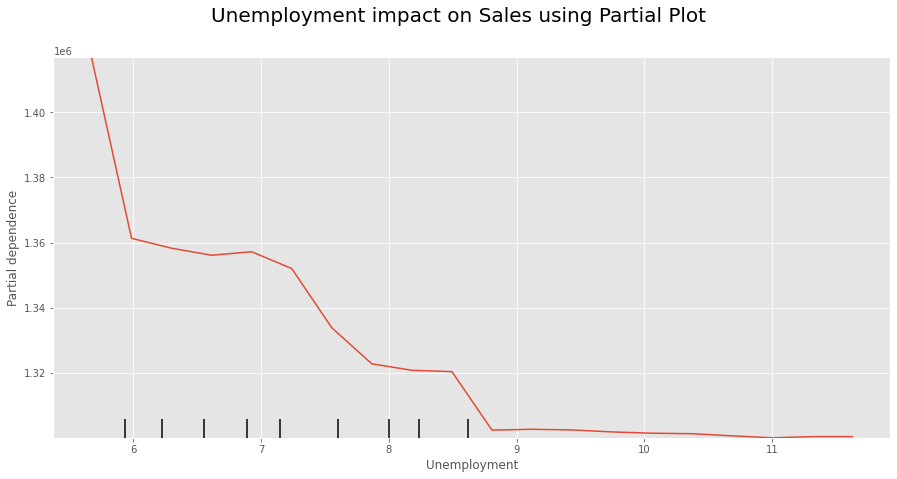

In [54]:
plot_partial_dependence(rf_model, X_test,['Unemployment'],n_jobs=-1, grid_resolution=20)
fig = plt.gcf()
fig.suptitle('Unemployment impact on Sales using Partial Plot',fontsize = 20.0)
fig.set_figheight(7)
fig.set_figwidth(15)

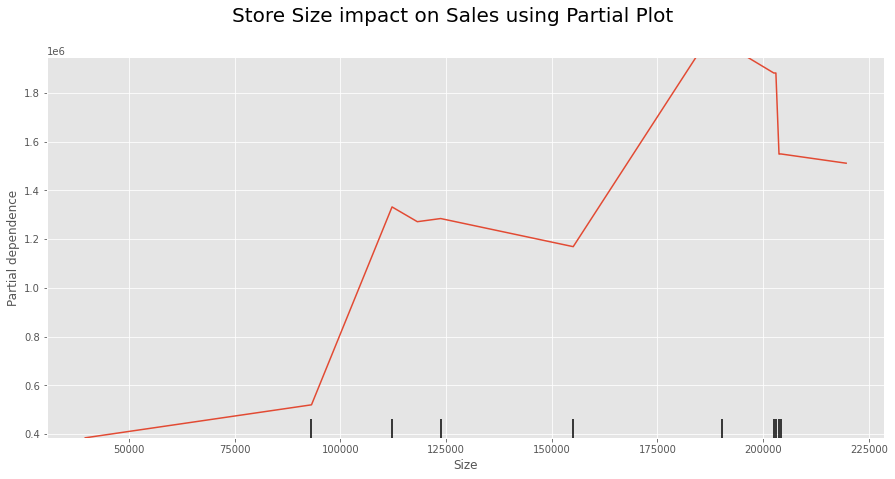

In [55]:
plot_partial_dependence(rf_model, X_test,['Size'],n_jobs=-1, grid_resolution=20)
fig = plt.gcf()
fig.suptitle('Store Size impact on Sales using Partial Plot',fontsize = 20.0)
fig.set_figheight(7)
fig.set_figwidth(15)

<b> Partial plot shows that there is clear relationship between holidays and sales. If there is holiday is the week, there is more sales in tha week.